# Set-up

The purpose of this notebook is to run experiments and compare the performances of 2D and 3D segmentations of the prostate using U-Net architecture. 

The comparison is made with two metrics, which are most used in the segmentation literature: 
- F1/Dice similarity score (DSC)
- Mean Absolute Distance (MAD)

We will get these scores for each slice of each volume in the testing dataset for 2D and 3D, split the resulting scores into 10 groups (by percentiles) and perform a T-test to determine if there is ant statistically significant difference between 2D and 3D segmentation.

This notebook will not perform the training process again; the previously trained 2D and 3D models will be loaded (to make the predictions of the labels on the data)

First we need to load the modules that will be used throughout this investigation:

In [0]:
import numpy as np
import os
import matplotlib.pyplot as plt

import tensorflow as tf
from keras.optimizers import Adam, SGD
from keras.preprocessing.image import ImageDataGenerator
from keras import backend as K

import cv2 as cv
from tqdm import tqdm
import random
import yaml
import zipfile

# Required to save models in HDF5 format
# !pip install pyyaml h5py  
import h5py

Using TensorFlow backend.


##Data manipulation

Now the data from Promise12 challenge needs to be downloaded

In [0]:
# Create folders and define paths

!mkdir results
!mkdir TRAINING_IMAGES
!mkdir TRAINING_MASKS


DATA_PATH = '/content/datasets-promise12'
RESULT_PATH = '/content/results'
IMAGE_PATH = '/content/TRAINING_IMAGES/'
MASK_PATH = '/content/TRAINING_MASKS/'

print('Image and label data downloaded: ')
print('Result directory created: <%s>.' % os.path.abspath(RESULT_PATH))

Image and label data downloaded: 
Result directory created: </content/results>.


In [0]:
# import data and unzip 
!wget https://github.com/gu98/MPHY0041_Segmentation/blob/master/data/datasets-promise12.zip?raw=true
!unzip datasets-promise12.zip?raw=true

--2020-05-25 12:35:58--  https://github.com/gu98/MPHY0041_Segmentation/blob/master/data/datasets-promise12.zip?raw=true
Resolving github.com (github.com)... 140.82.113.3
Connecting to github.com (github.com)|140.82.113.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/gu98/MPHY0041_Segmentation/raw/master/data/datasets-promise12.zip [following]
--2020-05-25 12:35:58--  https://github.com/gu98/MPHY0041_Segmentation/raw/master/data/datasets-promise12.zip
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/gu98/MPHY0041_Segmentation/master/data/datasets-promise12.zip [following]
--2020-05-25 12:35:58--  https://raw.githubusercontent.com/gu98/MPHY0041_Segmentation/master/data/datasets-promise12.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.co

To perform the experiments, all the data with the labels (i.e. training data set) needs to be split into training, validation and testing sets. There are 50 pieces of data available with the labels; it will be split into 40-5-5 split respecively.

The testing data set consists of the last 5 images in the dataset. These were not used for any training or validation of the models. This data was hold out, so this experiment can be performed on the unseen data.

In [0]:
# Training Data parameters
N= 50
img_width= 128
img_height= 128
img_thickness= 32
img_channels= 1

# Parse data into X_train, Y_train arrays 
X_train = np.zeros((N, img_thickness, img_height, img_width, img_channels), dtype=np.float32)
Y_train = np.zeros((N, img_thickness, img_height, img_width, img_channels), dtype=np.float32)

print('')
print('')
print('Loading Training Data')
print('')

for n in tqdm(range(N)):
    image = np.load(os.path.join(DATA_PATH, "image_train%02d.npy" % n))
    label = np.load(os.path.join(DATA_PATH, "label_train%02d.npy" % n))
    X_train[n] = image[:,:,:,np.newaxis]
    Y_train[n] = label[:,:,:,np.newaxis]

# Slice the training data and select data for testing (last 5 pieces of data)
X_test = X_train[45:]
Y_test = Y_train[45:]

print('Shape of X_test:', X_test.shape)
print('Shape of Y_test:', Y_test.shape)

100%|██████████| 50/50 [00:00<00:00, 554.83it/s]



Loading Training Data

Shape of X_test: (5, 32, 128, 128, 1)
Shape of Y_test: (5, 32, 128, 128, 1)


## Load trained models and predict

To run the experiments and get the metric scores, both real and predicted labels needed. Thus, both 2D and 3D trained models need to be loaded to avoid retraining (which can be lengthy).

Training metrics to load the model

In [0]:
# Dice and intersection metrics
def dice_coef(y_true, y_pred, smooth=1.0):

    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (
        K.sum(y_true_f) + K.sum(y_pred_f) + smooth)


def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)

###2D model 

In [0]:
# import 2D trained model 
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=1JlhvvzzPya7lKJ_ijfATdyazLrfnTDQN' -O 2D_best_model.h5

--2020-05-25 12:36:04--  https://docs.google.com/uc?export=download&id=1JlhvvzzPya7lKJ_ijfATdyazLrfnTDQN
Resolving docs.google.com (docs.google.com)... 173.194.216.138, 173.194.216.100, 173.194.216.139, ...
Connecting to docs.google.com (docs.google.com)|173.194.216.138|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-0k-4o-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/qfohva2iagg4broi7p2lnohp2q6oodgu/1590410100000/10112202923522750332/*/1JlhvvzzPya7lKJ_ijfATdyazLrfnTDQN?e=download [following]
--2020-05-25 12:36:07--  https://doc-0k-4o-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/qfohva2iagg4broi7p2lnohp2q6oodgu/1590410100000/10112202923522750332/*/1JlhvvzzPya7lKJ_ijfATdyazLrfnTDQN?e=download
Resolving doc-0k-4o-docs.googleusercontent.com (doc-0k-4o-docs.googleusercontent.com)... 173.194.216.132, 2607:f8b0:400c:c12::84
Connecting to doc-0k-4o-docs.googleusercontent.com (doc-0k

In [0]:
# Load the 2D model

path_2D_model = '/content/2D_best_model.h5'
model2D = tf.keras.models.load_model(path_2D_model,
                                    custom_objects={'dice_coef_loss': dice_coef_loss,'dice_coef': dice_coef})

In [0]:
# Obtain label predictions using 2D model

X_test_2D = np.reshape(X_test, (5*img_thickness, img_height, img_width, img_channels))
preds_test_2D = model2D.predict(X_test_2D, verbose=1)

preds_test_2D = np.reshape(preds_test_2D, (5, img_thickness, img_height, img_width, img_channels))
preds_test_t_2D = (preds_test_2D > 0.5).astype(np.uint8)

print('')
print('Shape of predicted lables using 2D model:', preds_test_t_2D.shape)

5/5 [==============================] - 14s 3s/step

Shape of predicted lables using 2D model: (5, 32, 128, 128, 1)


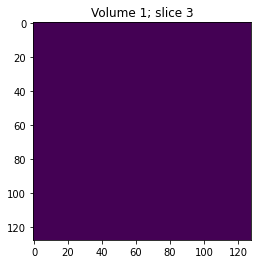

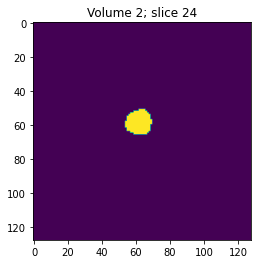

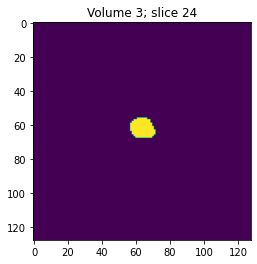

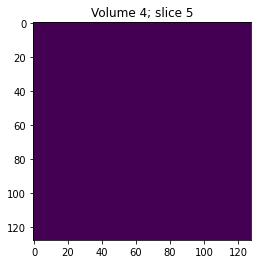

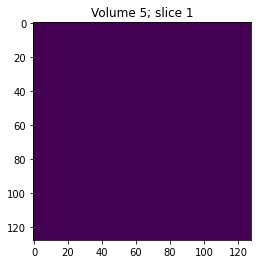

In [0]:
# Show the segmentation of random slices in each volume

for i in range(5):

  s = random.randint(0,31)

  plt.figure()
  plt.imshow(preds_test_t_2D[i,s,:,:,0])
  plt.title('Volume %s; slice %s' %((i+1),(s+1)))

###3D model


In [0]:
# import 3D trained model 
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=1xMk9RdW-F4DYTpW4YmzUfSEKE3n_Sffp' -O 3D_best_model.h5

--2020-05-25 12:36:30--  https://docs.google.com/uc?export=download&id=1xMk9RdW-F4DYTpW4YmzUfSEKE3n_Sffp
Resolving docs.google.com (docs.google.com)... 172.217.204.100, 172.217.204.138, 172.217.204.113, ...
Connecting to docs.google.com (docs.google.com)|172.217.204.100|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-00-4o-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/vnehip5rujdg5q4qu6v137eu4mrr9r3j/1590410175000/10112202923522750332/*/1xMk9RdW-F4DYTpW4YmzUfSEKE3n_Sffp?e=download [following]
--2020-05-25 12:36:33--  https://doc-00-4o-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/vnehip5rujdg5q4qu6v137eu4mrr9r3j/1590410175000/10112202923522750332/*/1xMk9RdW-F4DYTpW4YmzUfSEKE3n_Sffp?e=download
Resolving doc-00-4o-docs.googleusercontent.com (doc-00-4o-docs.googleusercontent.com)... 173.194.216.132, 2607:f8b0:400c:c12::84
Connecting to doc-00-4o-docs.googleusercontent.com (doc-00

In [0]:
# Load 3D model and resave with a different name 
path_3D_model = '/content/3D_best_model.h5'
model3D = tf.keras.models.load_model(path_3D_model,
                                    custom_objects={'dice_coef_loss': dice_coef_loss,'dice_coef': dice_coef})

In [0]:
# Obtain label predictions using 3D model

preds_test_3D = model3D.predict(X_test, verbose=1)
preds_test_t_3D = (preds_test_3D > 0.5).astype(np.uint8)

print('')
print('Shape of predicted lables using 3D model:', preds_test_t_3D.shape)

1/1 [==============================] - 0s 2ms/step

Shape of predicted lables using 3D model: (5, 32, 128, 128, 1)


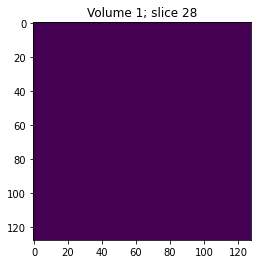

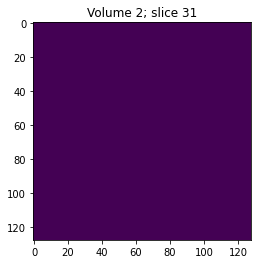

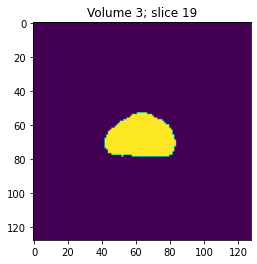

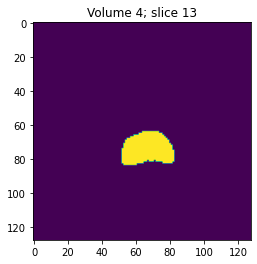

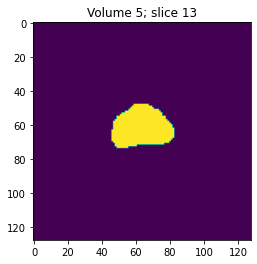

In [0]:
# Show the segmentation of random slices in each volume

for i in range(5):

  s = random.randint(0,31)

  plt.figure()
  plt.imshow(preds_test_t_3D[i,s,:,:,0])
  plt.title('Volume %s; slice %s' %((i+1),(s+1)))

# Experiments to compare 2D and 3D models

###Metrics

The following cells contain the functions used to get the scores for each metric

In [0]:
# Dice and intersection metrics

K.set_image_data_format('channels_last')
# Keras (K) version 
def dice_coef(y_true, y_pred, smooth=1.0):

    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (
        K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)

# Numpy (np) version 
def dice_F1coef(y_true, y_pred, smooth=1):

    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    intersection = np.sum(y_true_f * y_pred_f)
    num = 2 * intersection + smooth
    denom = np.sum(y_true_f) + np.sum(y_pred_f) + smooth
    f1 = num/denom
    return f1

Mean Absolute Distance in terms of pixels

In [0]:
def distance(x1,y1,x2,y2):
  '''
  Function to find the distance between 2 pixels
  Args:
    x1: x coordinate of pixel 1
    y1: y coordinate of pixel 1
    x2: x coordinate of pixel 2
    y2: y coordinate of pixel 2
  Returns:
    dist: distance between two pixels in terms of pixel
  '''
  xx = (x1 - x2) ** 2
  yy = (y1 - y2) ** 2
  dist = np.sqrt(xx + yy)

  return dist

In [0]:
def mean_distance(contour_1, contour_2):
  '''
  Function to find the mean distance between 2 contours, where distances
  between each pixel in contour_1 and closest pixel in contour_2 are claculated
  '''

  dist_array = np.array([])

  # for each pixel in contour_1 
  for n in range(contour_1.shape[1]):
    pixel_loc = contour_1[0,n,0,:]   # get pixel (x,y) location

    # get the shortest distance between contour_1 pixel and closest pixel in contour_2
    short_dist = np.Inf
    for i in contour_2[0,:,0,:]:
      dist = distance(pixel_loc[0], pixel_loc[1], i[0], i[1])

      if dist < short_dist:
        short_dist = dist
      
    dist_array = np.append(dist_array, short_dist)
    mean_distance = dist_array.mean()

  return mean_distance

In [0]:
# y_pred = X_train[0]
# y_pred_cont, _ = cv.findContours(y_pred[6,:,:,0].astype(np.uint8), cv.RETR_TREE, cv.CHAIN_APPROX_NONE)
# y_pred_cont = np.asarray(y_pred_cont)

# plt.figure()
# plt.imshow(y_pred[6,:,:,0].astype(np.uint8), cmap='gray')
# plt.colorbar()

###MAD t-test

In [0]:
import matplotlib.style as style
style.use('seaborn-poster')

In [0]:
from scipy import stats

In [0]:
# Find MDA empty slices 

# BD for 2D and 3D

bd_total_2D = np.array([])   # BD value of each slice in each volume
bd_mean_2D = np.array([])    # BD value of each volume

bd_total_3D = np.array([])   # BD value of each slice in each volume
bd_mean_3D = np.array([])    # BD value of each volume


print('')
print('Begin MAD evaluations for each testing slice')
print('')

for n in range(X_test.shape[0]):

  print('______________________________________________________')
  print('')
  print('Volume', (n+1))
  print('')

  
  # image to make prediction and its real label
  x_test = X_test[n]
  y_test = Y_test[n]

  # predicted labels
  y_pred_2D = preds_test_t_2D[n]
  y_pred_3D = preds_test_t_3D[n]

  boundary_distance_2D = np.array([])
  boundary_distance_3D = np.array([])

  # for each slice in an image
  for i in range(x_test.shape[0]):

    # real contour
    y_label_cont, _ = cv.findContours(y_test[i,:,:,0].astype(np.uint8),cv.RETR_TREE,cv.CHAIN_APPROX_NONE)
    y_label_cont = np.asarray(y_label_cont) 

    if len(y_label_cont)>1:
      y_label_cont = np.concatenate( y_label_cont, axis=0 )
      y_label_cont = np.array([y_label_cont])
    
    # predicted contour 2D
    y_pred_cont_2D, _ = cv.findContours(y_pred_2D[i,:,:,0].astype(np.uint8), cv.RETR_TREE, cv.CHAIN_APPROX_NONE)
    y_pred_cont_2D = np.asarray(y_pred_cont_2D)

    if len(y_pred_cont_2D)>1:
      y_pred_cont_2D = np.concatenate( y_pred_cont_2D, axis=0 )
      y_pred_cont_2D = np.array([y_pred_cont_2D])

    # predicted contour 3D
    y_pred_cont_3D, _ = cv.findContours(y_pred_3D[i,:,:,0].astype(np.uint8), cv.RETR_TREE, cv.CHAIN_APPROX_NONE)
    y_pred_cont_3D = np.asarray(y_pred_cont_3D)

    if len(y_pred_cont_3D)>1:
      y_pred_cont_3D = np.concatenate( y_pred_cont_3D, axis=0 )
      y_pred_cont_3D = np.array([y_pred_cont_3D])


    # if there is a contour - continue, else - return zero
    if y_pred_cont_2D.shape != (0,) and y_label_cont.shape != (0,):
        
      # mean distances between pixels in predicted with closest pixels in label
      mean_pred_train_2D = mean_distance(y_pred_cont_2D, y_label_cont)

      # mean distances between pixels in label with closest pixels in predicted
      mean_train_pred_2D = mean_distance(y_label_cont, y_pred_cont_2D)

      # calculate symmetric boundary distance 
      BD_2D = (mean_pred_train_2D + mean_train_pred_2D) / 2

      boundary_distance_2D = np.append(boundary_distance_2D, BD_2D)

    else:
      print('slice %s has %s contour pixels in 2D and %s in label' %((i+1), y_pred_cont_2D.shape, y_label_cont.shape))
      #print('slice %s has zero contour pixels in 2D or 3D' %(i+1) )

    
    # if there is a contour - continue, else - return zero
    if y_pred_cont_3D.shape != (0,) and y_label_cont.shape != (0,):
        
      # mean distances between pixels in predicted with closest pixels in label
      mean_pred_train_3D = mean_distance(y_pred_cont_3D, y_label_cont)

      # mean distances between pixels in label with closest pixels in predicted
      mean_train_pred_3D = mean_distance(y_label_cont, y_pred_cont_3D)

      # calculate symmetric boundary distance 
      BD_3D = (mean_pred_train_3D + mean_train_pred_3D) / 2

      boundary_distance_3D = np.append(boundary_distance_3D, BD_3D)

    else:
      print('slice %s has %s contour pixels in 3D and %s in label' %((i+1), y_pred_cont_3D.shape, y_label_cont.shape))

     
  bd_total_2D = np.append(bd_total_2D, boundary_distance_2D)
  bd_mean_2D = np.append(bd_mean_2D, boundary_distance_2D.mean())

  bd_total_3D = np.append(bd_total_3D, boundary_distance_3D)
  bd_mean_3D = np.append(bd_mean_3D, boundary_distance_3D.mean())
  
  print('')



Begin MAD evaluations for each testing slice

______________________________________________________

Volume 1

slice 1 has (1, 4, 1, 2) contour pixels in 2D and (0,) in label
slice 1 has (0,) contour pixels in 3D and (0,) in label
slice 2 has (0,) contour pixels in 2D and (0,) in label
slice 2 has (0,) contour pixels in 3D and (0,) in label
slice 3 has (0,) contour pixels in 2D and (0,) in label
slice 3 has (0,) contour pixels in 3D and (0,) in label
slice 4 has (0,) contour pixels in 2D and (0,) in label
slice 4 has (0,) contour pixels in 3D and (0,) in label
slice 5 has (1, 28, 1, 2) contour pixels in 2D and (0,) in label
slice 5 has (0,) contour pixels in 3D and (0,) in label
slice 6 has (1, 54, 1, 2) contour pixels in 2D and (0,) in label
slice 6 has (0,) contour pixels in 3D and (0,) in label
slice 7 has (0,) contour pixels in 3D and (1, 34, 1, 2) in label
slice 22 has (1, 52, 1, 2) contour pixels in 2D and (0,) in label
slice 22 has (1, 68, 1, 2) contour pixels in 3D and (0,) i

____________________________________________________________
____________________________________________________________

MAD T-test with scores divided into 4 bin(s)

____________________________________________________________

Fold 1

T value: -0.5914474406280393
P value: 0.5577229672818815
____________________________________________________________

Fold 2

T value: -4.829806261704558
P value: 2.3838261859499895e-05
____________________________________________________________

Fold 3

T value: -2.741116420470797
P value: 0.0093739357599329
____________________________________________________________

Fold 4

T value: -0.7318846086938771
P value: 0.4689770061752936
____________________________________________________________



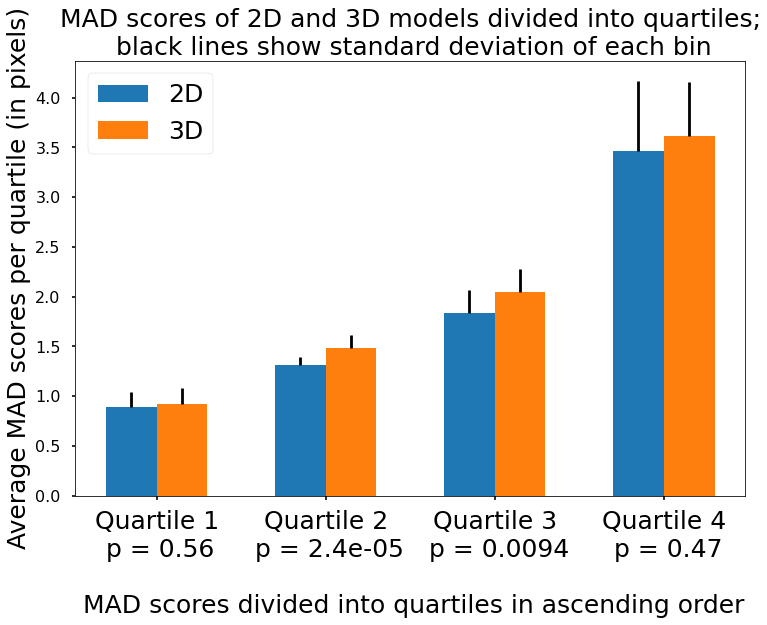

In [0]:
n_folds = 4

for i in range(n_folds-1,n_folds):

  print('____________________________________________________________')
  print('____________________________________________________________')
  print('')
  print('MAD T-test with scores divided into %s bin(s)' %(i+1))
  print('')

  # Sort all the MAD scores for each slice in 2D and 3D in the ascending order
  sort_mad_2D = np.sort(bd_total_2D)
  sort_mad_3D = np.sort(bd_total_3D)

  # Get i percentile groups of the scores
  folds_mad_2D = np.array_split(sort_mad_2D, (i+1) )
  folds_mad_3D = np.array_split(sort_mad_3D, (i+1) )

  # binz = np.array([])
  # for z in range(i+1):
  #   binz = np.append(binz, 'Bin ' + str(z+1))

  # df_2D = pd.DataFrame(folds_mad_2D, index = binz)
  # df_3D = pd.DataFrame(folds_mad_3D, index = binz)

  # display(df_2D.T, df_3D.T)

  # Mean values in each fold
  mean_mad_2D = np.array([])
  mean_mad_3D = np.array([])

  sd_mad_2D = np.array([])
  sd_mad_3D = np.array([])

  for m in range(len(folds_mad_2D)):

    mean_mad_2D = np.append(mean_mad_2D, folds_mad_2D[m].mean())
    mean_mad_3D = np.append(mean_mad_3D, folds_mad_3D[m].mean())

    sd_mad_2D = np.append(sd_mad_2D, np.std(folds_mad_2D[m]))
    sd_mad_3D = np.append(sd_mad_3D, np.std(folds_mad_3D[m]))

  zeros = np.zeros(i+1)

  sd_mad_2D = np.array([zeros,sd_mad_2D])
  sd_mad_3D = np.array([zeros,sd_mad_3D])

  mad_p_val = np.array([])

  for j in range(len(folds_mad_2D)):

    print('____________________________________________________________')
    print('')
    print('Fold', (j+1))
    print('')

    t_value, p_value = stats.ttest_ind(folds_mad_2D[j], folds_mad_3D[j])

    mad_p_val = np.append(mad_p_val, p_value)

    print('T value:', t_value)
    print('P value:', p_value)


  bins = np.arange(1,i+2,1)

  x_ticks = np.array([])
  for num in range(i+1):
    x_ticks = np.append(x_ticks, 'Quartile ' + str(num+1) + '\n p = ' + str(float("{0:.2g}".format(mad_p_val[num]))))

  print('____________________________________________________________')
  print('')

  fig = plt.figure(figsize=(12,8))

  bar1 = plt.subplot()
  
  bar1.bar(bins - 0.15, mean_mad_2D, yerr = sd_mad_2D, width = 0.3, label = '2D')
  bar1.bar(bins + 0.15, mean_mad_3D, yerr = sd_mad_3D, width = 0.3, label = '3D')

  plt.xticks(bins, x_ticks, fontsize = 25)
  plt.xlabel('\n MAD scores divided into quartiles in ascending order', fontsize = 25)
  plt.ylabel('Average MAD scores per quartile (in pixels)', fontsize = 25)

  plt.legend(loc = 'upper left', fontsize = 25)
  plt.title('MAD scores of 2D and 3D models divided into quartiles;\n black lines show standard deviation of each bin', fontsize = 25)

  plt.savefig('MAD_ttest_' + str(i+1) + '_bins', quality = 100, dpi = 500, bbox_inches = 'tight')
  plt.show()

 ### DSC t-test

______________________________________________________

Volume 1

______________________________________________________

Volume 2

______________________________________________________

Volume 3

______________________________________________________

Volume 4

______________________________________________________

Volume 5



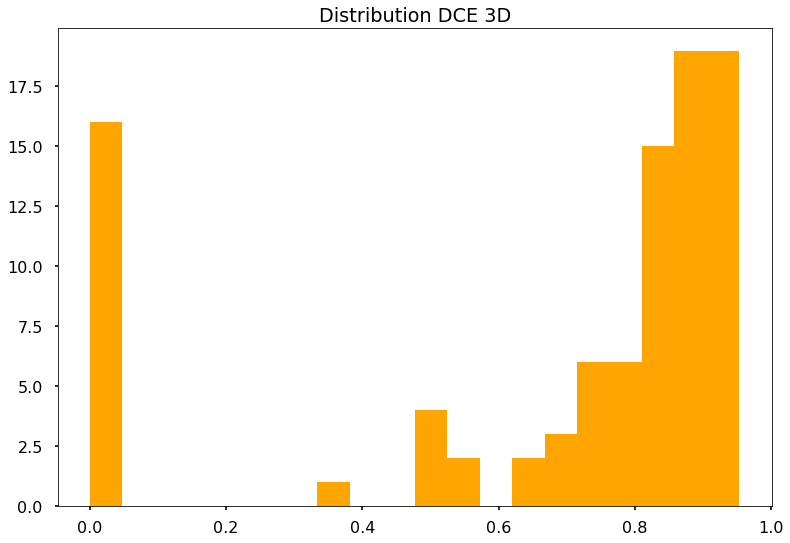

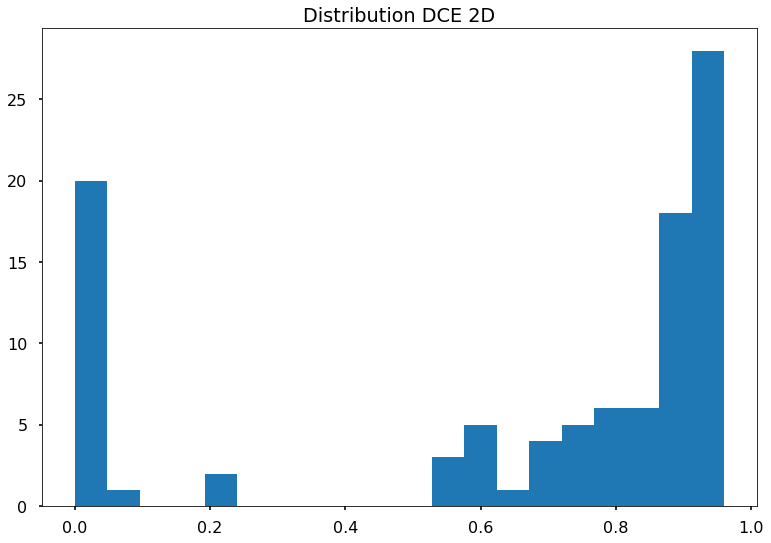

In [0]:
# Compute DSC for each slice for both 2D and 3D models

dce_total_2D = np.array([])   # BD value of each slice in each volume
dce_mean_2D = np.array([])    # BD value of each volume

dce_total_3D = np.array([])   # BD value of each slice in each volume
dce_mean_3D = np.array([])    # BD value of each volume

for n in range(Y_test.shape[0]):

  print('______________________________________________________')
  print('')
  print('Volume', (n+1))
  print('')

  # image to make prediction and its real label
  y_test = Y_test[n]

  # predicted labels
  y_pred_2D = preds_test_t_2D[n]
  y_pred_3D = preds_test_t_3D[n]

  dice_score_2D = np.array([])
  dice_score_3D = np.array([])

  # for each slice in an image
  for i in range(y_test.shape[0]):
    
    dce_2D = dice_F1coef(y_pred_2D[i], y_test[i], smooth=0.0001)
    dce_3D = dice_F1coef(y_pred_3D[i], y_test[i], smooth=0.0001)

    dice_score_2D = np.append(dice_score_2D, dce_2D)
    dice_score_3D = np.append(dice_score_3D, dce_3D)

  dce_total_2D = np.append(dce_total_2D, dice_score_2D)
  dce_mean_2D = np.append(dce_mean_2D, dice_score_2D.mean())

  dce_total_3D = np.append(dce_total_3D, dice_score_3D)
  dce_mean_3D = np.append(dce_mean_3D, dice_score_3D.mean())

y_2D_slices = np.reshape(preds_test_t_2D, (5*img_thickness, img_height, img_width, img_channels))
y_2D_empty_slices = y_2D_slices[:,:,:,:].max(axis=1)
logic_2D_empty = y_2D_empty_slices.max(axis=1)==0


y_3D_slices = np.reshape(preds_test_t_3D, (5*img_thickness, img_height, img_width, img_channels))
y_3D_empty_slices = y_3D_slices[:,:,:,:].max(axis=1) 
logic_3D_empty = y_3D_empty_slices.max(axis=1)==0

#delete empty slices ( where all labels and prediction agree it should be empty)
dce_total_2D = np.delete(dce_total_2D, np.where(logic_2D_empty==True))
dce_total_3D = np.delete(dce_total_3D, np.where(logic_3D_empty==True))

# Sort all the MAD scores for each slice in 2D and 3D in the ascending order
sort_dce_2D = np.sort(dce_total_2D)
sort_dce_3D = np.sort(dce_total_3D)

# print(sort_dce_2D.shape, sort_dce_3D.shape ) 

# Plot DSC score distribution

plt.hist(dce_total_3D, bins = 20, color = 'orange')
plt.title('Distribution DCE 3D')
plt.show()
plt.hist(dce_total_2D, bins = 20)
plt.title('Distribution DCE 2D')
plt.show()

____________________________________________________________
____________________________________________________________

DCE T-test with scores divided into 4 bin(s)

____________________________________________________________

Fold 1

T value: -1.7842550285070147
P value: 0.08083836991415493
____________________________________________________________

Fold 2

T value: -2.5464233786190014
P value: 0.014295591311720169
____________________________________________________________

Fold 3

T value: 4.577776533499032
P value: 3.5699152111128704e-05
____________________________________________________________

Fold 4

T value: 0.8471866791073996
P value: 0.4013744115830822
____________________________________________________________



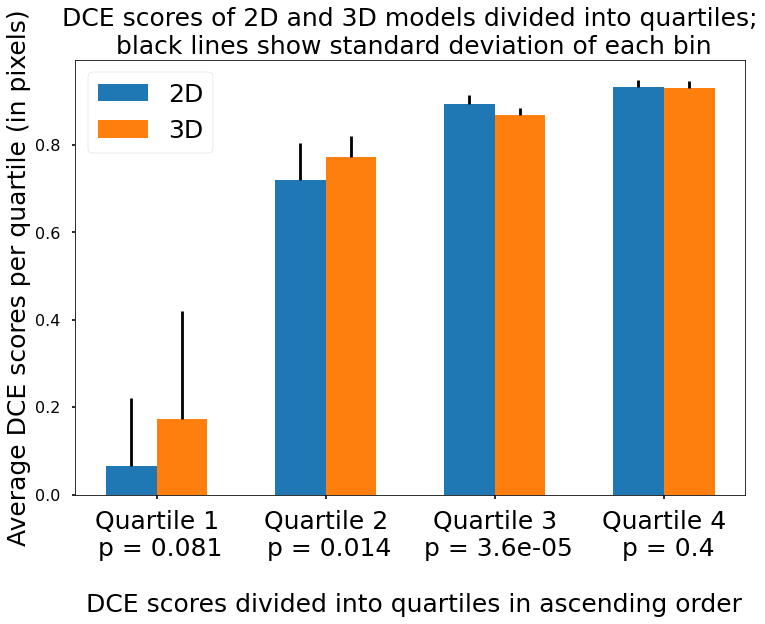

In [0]:
# Perform T-test from overall T-test to percentile t-test up to the given 
# number of folds

n_folds = 4

for i in range(n_folds-1,n_folds):

  print('____________________________________________________________')
  print('____________________________________________________________')
  print('')
  print('DCE T-test with scores divided into %s bin(s)' %(i+1))
  print('')

  # Get i percentile groups of the scores
  folds_dce_2D = np.array_split(sort_dce_2D, (i+1) )
  folds_dce_3D = np.array_split(sort_dce_3D, (i+1) )

  # Mean values in each fold
  mean_dce_2D = np.array([])
  mean_dce_3D = np.array([])

  sd_dce_2D = np.array([])
  sd_dce_3D = np.array([])

  for m in range(len(folds_dce_2D)):

    mean_dce_2D = np.append(mean_dce_2D, folds_dce_2D[m].mean())
    mean_dce_3D = np.append(mean_dce_3D, folds_dce_3D[m].mean())

    sd_dce_2D = np.append(sd_dce_2D, np.std(folds_dce_2D[m]))
    sd_dce_3D = np.append(sd_dce_3D, np.std(folds_dce_3D[m]))

  zeros = np.zeros(i+1)

  sd_dce_2D = np.array([zeros,sd_dce_2D])
  sd_dce_3D = np.array([zeros,sd_dce_3D])

  dce_p_val = np.array([])

  for j in range(len(folds_dce_2D)):

    print('____________________________________________________________')
    print('')
    print('Fold', (j+1))
    print('')

    t_value, p_value = stats.ttest_ind(folds_dce_2D[j], folds_dce_3D[j])

    dce_p_val = np.append(dce_p_val, p_value)

    print('T value:', t_value)
    print('P value:', p_value)


  bins = np.arange(1,i+2,1)

  x_ticks = np.array([])
  for num in range(i+1):
    x_ticks = np.append(x_ticks, 'Quartile ' + str(num+1) + '\n p = ' + str(float("{0:.2g}".format(dce_p_val[num]))))

  print('____________________________________________________________')
  print('')

  fig = plt.figure(figsize=(12,8))

  bar1 = plt.subplot()
  
  bar1.bar(bins - 0.15, mean_dce_2D, yerr = sd_dce_2D, width = 0.3, label = '2D')
  bar1.bar(bins + 0.15, mean_dce_3D, yerr = sd_dce_3D, width = 0.3, label = '3D')

  plt.xticks(bins, x_ticks, fontsize = 25)
  plt.xlabel('\n DCE scores divided into quartiles in ascending order', fontsize = 25)
  plt.ylabel('Average DCE scores per quartile (in pixels)', fontsize = 25)

  plt.legend(loc = 'upper left', fontsize = 25)
  plt.title('DCE scores of 2D and 3D models divided into quartiles;\n black lines show standard deviation of each bin', fontsize = 25)

  plt.savefig('DCE_ttest_' + str(i+1) + '_bins', quality = 100, dpi = 500, bbox_inches = 'tight')
  plt.show()

## Qualitative analysis

In [0]:
# The boundary distances of the models are compared and the frequency
# of common error types is noted. This allows for qualitative analysis of
# slices with more dramatic errors to be carried out as well as analysis
# of the prevalence of each type of error

# BD for 2D and 3D

bd_total_2D = np.array([])   # BD value of each slice in each volume
bd_mean_2D = np.array([])    # BD value of each volume

bd_total_3D = np.array([])   # BD value of each slice in each volume
bd_mean_3D = np.array([])    # BD value of each volume


# Counters for the total occurances of each type of error
total_error_counter_all_empty = 0
total_error_counter_any_empty = 0
total_error_counter_2D_empty = 0
total_error_counter_3D_empty = 0
total_error_counter_false_positive = 0

# Arrays for each type of error in volume
total_error = [[],[],[],[],[]]
total_2D = [[],[],[],[],[]]
total_3D = [[],[],[],[],[]]
total_label = [[],[],[],[],[]]
all_slices = [[],[],[],[],[]]

print('')
print('Begin MAD evaluations for each testing slice')
print('')

for n in range(X_test.shape[0]):

  print('______________________________________________________')
  print('')
  print('Volume', (n+1))
  print('')

  
  # Counters for each type of error
  error_counter_total = 0
  error_counter_total_all = 0
  error_counter_2D = 0
  error_counter_3D = 0
  error_counter_label = 0

  # image to make prediction and its real label
  x_test = X_test[n]
  y_test = Y_test[n]

  # predicted labels
  y_pred_2D = preds_test_t_2D[n]
  y_pred_3D = preds_test_t_3D[n]

  boundary_distance_2D = np.array([])
  boundary_distance_3D = np.array([])

  # for each slice in an image
  for i in range(x_test.shape[0]):

    # real contour
    y_label_cont, _ = cv.findContours(y_test[i,:,:,0].astype(np.uint8),cv.RETR_TREE,cv.CHAIN_APPROX_NONE)
    y_label_cont = np.asarray(y_label_cont) 

    if len(y_label_cont)>1:
      y_label_cont = np.concatenate( y_label_cont, axis=0 )
      y_label_cont = np.array([y_label_cont])
 
    
    # predicted contour 2D
    y_pred_cont_2D, _ = cv.findContours(y_pred_2D[i,:,:,0].astype(np.uint8), cv.RETR_TREE, cv.CHAIN_APPROX_NONE)
    y_pred_cont_2D = np.asarray(y_pred_cont_2D)

    if len(y_pred_cont_2D)>1:
      y_pred_cont_2D = np.concatenate( y_pred_cont_2D, axis=0 )
      y_pred_cont_2D = np.array([y_pred_cont_2D])

    # predicted contour 3D
    y_pred_cont_3D, _ = cv.findContours(y_pred_3D[i,:,:,0].astype(np.uint8), cv.RETR_TREE, cv.CHAIN_APPROX_NONE)
    y_pred_cont_3D = np.asarray(y_pred_cont_3D)

    if len(y_pred_cont_3D)>1:
      y_pred_cont_3D = np.concatenate( y_pred_cont_3D, axis=0 )
      y_pred_cont_3D = np.array([y_pred_cont_3D])



#Checking for any blank slides and adding them to the total error count for any blanks
    if y_pred_cont_2D.shape == (0,) or y_pred_cont_3D.shape == (0,) or y_label_cont.shape == (0,):
      error_counter_total += 1
      total_error_counter_any_empty += 1

#Checking for where all slides are blanks (total true negatives)
    if y_pred_cont_2D.shape == (0,) and y_pred_cont_3D.shape == (0,) and y_label_cont.shape == (0,):
      error_counter_total_all += 1
      total_error_counter_all_empty += 1
      total_error[n].append((n+1+ 0.1))
    else:
      total_error[n].append(np.nan)

#Checking for slides where the 2D model predicts a blank slide but not all slides are blank
    if y_pred_cont_2D.shape == (0,)and (y_pred_cont_2D.shape == (0,) and y_pred_cont_3D.shape == (0,) and y_label_cont.shape == (0,)) != 1: #and y_label_cont.shape == (0,):
      error_counter_2D += 1
      total_error_counter_2D_empty += 1
      total_2D[n].append((n+1+0.3))
      all_slices[n].append(i)
    else:
      total_2D[n].append(np.nan)
      all_slices[n].append(i)

#Checking for slides where the 3D model predicts a blank slide but not all slides are blank
    if y_pred_cont_3D.shape == (0,) and (y_pred_cont_2D.shape == (0,) and y_pred_cont_3D.shape == (0,) and y_label_cont.shape == (0,)) != 1:# and y_label_cont.shape == (0,):
      error_counter_3D += 1
      total_error_counter_3D_empty += 1
      total_3D[n].append((n+1+0.4))
    else:
      total_3D[n].append(np.nan)

#Checking for slides where the label slide is blank but either the 2D or 3D model are not blank (false positives)
    if y_label_cont.shape == (0,) and (y_pred_cont_2D.shape == (0,) and y_pred_cont_3D.shape == (0,)) != 1:
      error_counter_label += 1
      total_error_counter_false_positive += 1
      total_label[n].append((n+1+0.2))
    else:
      total_label[n].append(np.nan)


    # if there is a contour - continue, else - return zero
    if y_pred_cont_2D.shape != (0,) and y_label_cont.shape != (0,):
        
      # mean distances between pixels in predicted with closest pixels in label
      mean_pred_train_2D = mean_distance(y_pred_cont_2D, y_label_cont)

      # mean distances between pixels in label with closest pixels in predicted
      mean_train_pred_2D = mean_distance(y_label_cont, y_pred_cont_2D)

      # calculate symmetric boundary distance 
      BD_2D = (mean_pred_train_2D + mean_train_pred_2D) / 2

      boundary_distance_2D = np.append(boundary_distance_2D, BD_2D)

    else:
      print('slice %s has %s contour pixels in 2D and %s in label' %((i+1), y_pred_cont_2D.shape, y_label_cont.shape))

    
    # if there is a contour - continue, else - return zero
    if y_pred_cont_3D.shape != (0,) and y_label_cont.shape != (0,):
        
      # mean distances between pixels in predicted with closest pixels in label
      mean_pred_train_3D = mean_distance(y_pred_cont_3D, y_label_cont)

      # mean distances between pixels in label with closest pixels in predicted
      mean_train_pred_3D = mean_distance(y_label_cont, y_pred_cont_3D)

      # calculate symmetric boundary distance 
      BD_3D = (mean_pred_train_3D + mean_train_pred_3D) / 2

      boundary_distance_3D = np.append(boundary_distance_3D, BD_3D)

    else:
      print('slice %s has %s contour pixels in 3D and %s in label' %((i+1), y_pred_cont_3D.shape, y_label_cont.shape))
     
  bd_total_2D = np.append(bd_total_2D, boundary_distance_2D)
  bd_mean_2D = np.append(bd_mean_2D, boundary_distance_2D.mean())

  bd_total_3D = np.append(bd_total_3D, boundary_distance_3D)
  bd_mean_3D = np.append(bd_mean_3D, boundary_distance_3D.mean())
  
  print('')
  print('In volume %s there are %s errors, %s of which have all zeros, %s 2D errors, %s 3D errors and %s label errors' %((n+1),error_counter_total,error_counter_total_all,error_counter_2D,error_counter_3D,error_counter_label))
  print('')
  print('There are %s where 3D is under sensitive and %s where 2D is oversensitive' %(error_counter_3D,error_counter_2D))
  print('total' , total_error)
  print('2D ', total_2D)
  print('3D ', total_3D)
  print('label ', total_label)

print('')
print('In total there are %s where 3D is under sensitive and %s where 2D is oversensitive' %(total_error_counter_3D_empty,total_error_counter_2D_empty))



Begin MAD evaluations for each testing slice

______________________________________________________

Volume 1

slice 1 has (1, 4, 1, 2) contour pixels in 2D and (0,) in label
slice 1 has (0,) contour pixels in 3D and (0,) in label
slice 2 has (0,) contour pixels in 2D and (0,) in label
slice 2 has (0,) contour pixels in 3D and (0,) in label
slice 3 has (0,) contour pixels in 2D and (0,) in label
slice 3 has (0,) contour pixels in 3D and (0,) in label
slice 4 has (0,) contour pixels in 2D and (0,) in label
slice 4 has (0,) contour pixels in 3D and (0,) in label
slice 5 has (1, 28, 1, 2) contour pixels in 2D and (0,) in label
slice 5 has (0,) contour pixels in 3D and (0,) in label
slice 6 has (1, 54, 1, 2) contour pixels in 2D and (0,) in label
slice 6 has (0,) contour pixels in 3D and (0,) in label
slice 7 has (0,) contour pixels in 3D and (1, 34, 1, 2) in label
slice 22 has (1, 52, 1, 2) contour pixels in 2D and (0,) in label
slice 22 has (1, 68, 1, 2) contour pixels in 3D and (0,) i


In total there are 83 errors, 58 of which have all zeros, 2 2D errors, 9 3D errors and 23 label errors

Done!
32
32


Text(0.5, 1.0, 'Slides Excluded From MAD and Reasoning')

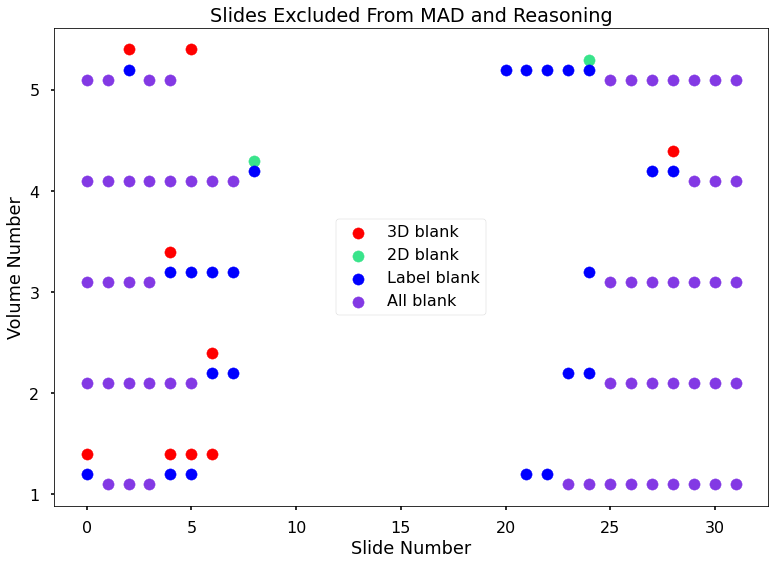

In [0]:
# Plot a graph to show the position of empty slices in each model 
print('')
print('In total there are %s errors, %s of which have all zeros, %s 2D errors, %s 3D errors and %s label errors' %(total_error_counter_any_empty,total_error_counter_all_empty,total_error_counter_2D_empty,total_error_counter_3D_empty,total_error_counter_false_positive))
print('')
print('Done!')
print(len(total_3D[:][0]))
print(len(all_slices[:][0]))

fig = plt.figure()
ax1 = fig.add_subplot(111)
ax1.scatter(all_slices[:][0],(total_3D[:][0]),color = [(1,0,0,1)],label='3D blank')
ax1.scatter(all_slices[:][0],(total_3D[:][1]),color = [(1,0,0,1)] )
ax1.scatter(all_slices[:][0],(total_3D[:][2]),color = [(1,0,0,1)])
ax1.scatter(all_slices[:][0],(total_3D[:][3]),color = [(1,0,0,1)])
ax1.scatter(all_slices[:][0],(total_3D[:][4]),color = [(1,0,0,1)])
ax1.scatter(all_slices[:][0],total_2D[:][0],color = [(0.222,0.893,0.5466,1)],label='2D blank')
ax1.scatter(all_slices[:][0],total_2D[:][1],color = [(0.222,0.893,0.5466,1)])
ax1.scatter(all_slices[:][0],total_2D[:][2],color = [(0.222,0.893,0.5466,1)])
ax1.scatter(all_slices[:][0],total_2D[:][3],color = [(0.222,0.893,0.5466,1)])
ax1.scatter(all_slices[:][0],total_2D[:][4],color = [(0.222,0.893,0.5466,1)])
ax1.scatter(all_slices[:][0],total_label[:][0],color = [(0,0,1,1)],label='Label blank')
ax1.scatter(all_slices[:][0],total_label[:][1],color = [(0,0,1,1)])
ax1.scatter(all_slices[:][0],total_label[:][2],color = [(0,0,1,1)])
ax1.scatter(all_slices[:][0],total_label[:][3],color = [(0,0,1,1)])
ax1.scatter(all_slices[:][0],total_label[:][4],color = [(0,0,1,1)])
ax1.scatter(all_slices[:][0],total_error[:][0],color= [(0.5155,0.222,0.89333,1)],label='All blank')
ax1.scatter(all_slices[:][0],total_error[:][1],color= [(0.5155,0.222,0.89333,1)])
ax1.scatter(all_slices[:][0],total_error[:][2],color= [(0.5155,0.222,0.89333,1)])
ax1.scatter(all_slices[:][0],total_error[:][3],color= [(0.5155,0.222,0.89333,1)])
ax1.scatter(all_slices[:][0],total_error[:][4],color= [(0.5155,0.222,0.89333,1)])
plt.legend(loc=10)
plt.xlabel('Slide Number')
plt.ylabel('Volume Number')
plt.title('Slides Excluded From MAD and Reasoning')


Begin Contour Analysis for Each Slice



/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:63: UserWarning: No contour levels were found within the data range.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:64: UserWarning: No contour levels were found within the data range.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:65: UserWarning: No contour levels were found within the data range.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


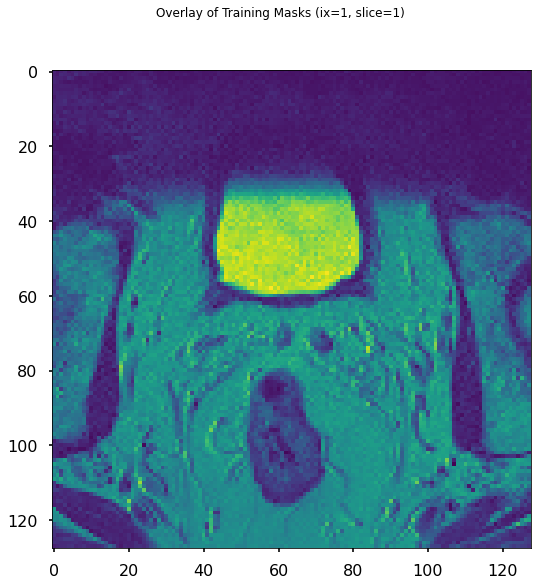

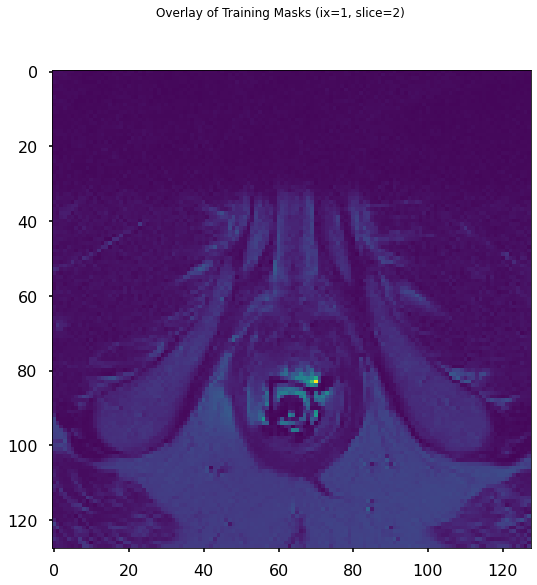

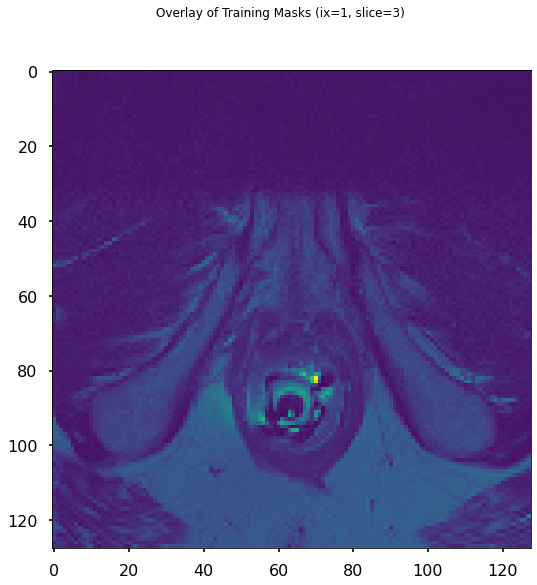

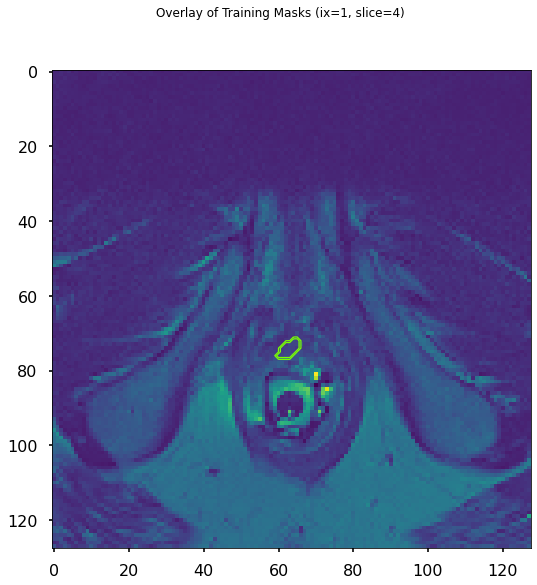

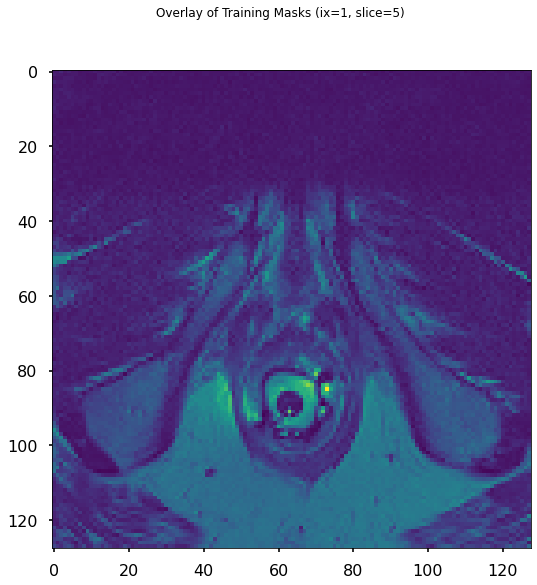

...

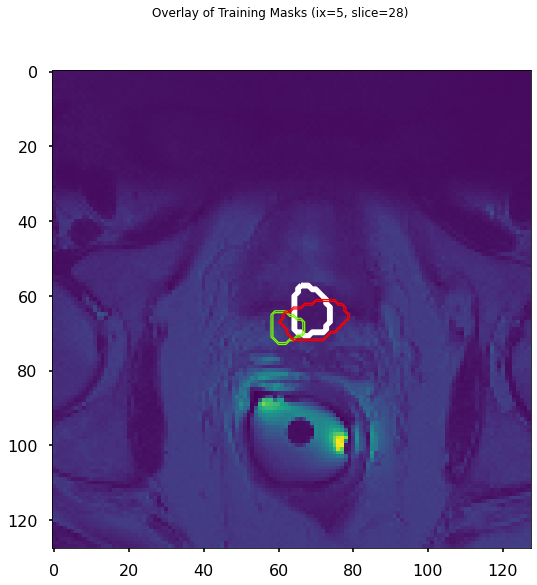

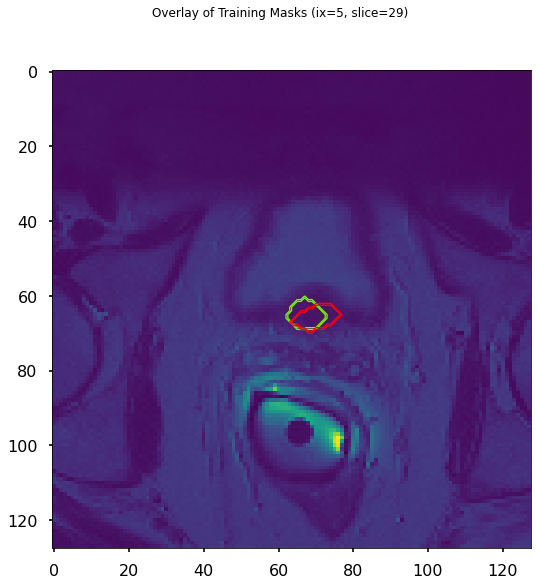

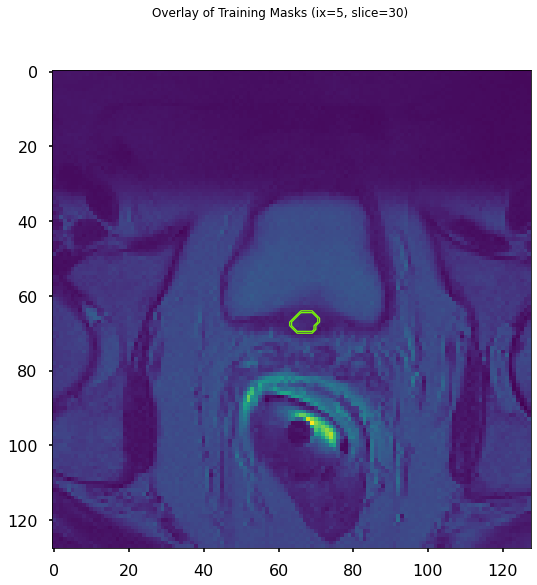

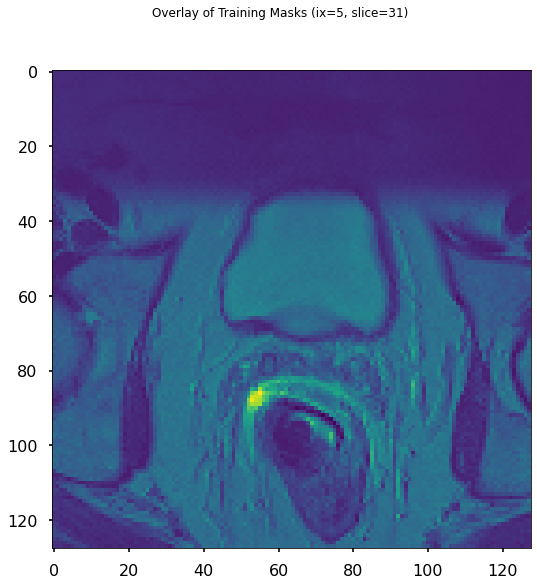

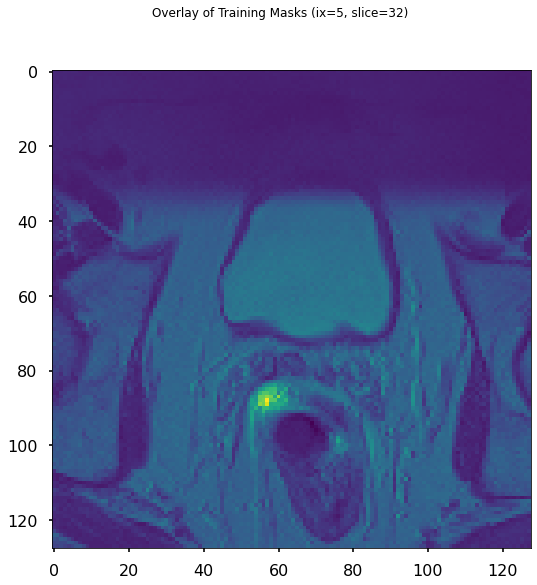

In [0]:
# Mask Overlay Generation
# This code generates a series of images where the contour outlines of each model prediction (true in white, 2D in green and 3D in red) are overlayed
# onto the MRI image of that slice

# BD for 2D and 3D
bd_total_2D = np.array([])   # BD value of each slice in each volume
bd_mean_2D = np.array([])    # BD value of each volume

bd_total_3D = np.array([])   # BD value of each slice in each volume
bd_mean_3D = np.array([])    # BD value of each volume


print('')
print('Begin Contour Analysis for Each Slice')
print('')

for n in range(X_test.shape[0]):


  # image to make prediction and its real label
  x_test = X_test[n]
  y_test = Y_test[n]

  # predicted labels
  y_pred_2D = preds_test_t_2D[n]
  y_pred_3D = preds_test_t_3D[n]

  boundary_distance_2D = np.array([])
  boundary_distance_3D = np.array([])

  # for each slice in an image
  for i in range(x_test.shape[0]):

    # real contour
    y_label_cont, _ = cv.findContours(y_test[i,:,:,0].astype(np.uint8),cv.RETR_TREE,cv.CHAIN_APPROX_NONE)
    y_label_cont = np.asarray(y_label_cont) 

    if len(y_label_cont)>1:
      y_label_cont = np.concatenate( y_label_cont, axis=0 )
      y_label_cont = np.array([y_label_cont])

    # predicted contour 2D
    y_pred_cont_2D, _ = cv.findContours(y_pred_2D[i,:,:,0].astype(np.uint8), cv.RETR_TREE, cv.CHAIN_APPROX_NONE)
    y_pred_cont_2D = np.asarray(y_pred_cont_2D)

    if len(y_pred_cont_2D)>1:
      y_pred_cont_2D = np.concatenate( y_pred_cont_2D, axis=0 )
      y_pred_cont_2D = np.array([y_pred_cont_2D])

    # predicted contour 3D
    y_pred_cont_3D, _ = cv.findContours(y_pred_3D[i,:,:,0].astype(np.uint8), cv.RETR_TREE, cv.CHAIN_APPROX_NONE)
    y_pred_cont_3D = np.asarray(y_pred_cont_3D)

    if len(y_pred_cont_3D)>1:
      y_pred_cont_3D = np.concatenate( y_pred_cont_3D, axis=0 )
      y_pred_cont_3D = np.array([y_pred_cont_3D])

# Plotting a figure with the outlines of each mask overlayed onto the original scan image
    fig = plt.figure()
    #fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, gridspec_kw={'hspace': 0.5})
    fig.suptitle(f'Overlay of Training Masks (ix={n+1}, slice={i+1})', fontsize=12)
    plt.imshow(np.squeeze(X_test[(n-1),(i-1),:,:,0]))
    plt.contour(np.squeeze(Y_test[(n-1),(i-1),:,:,0]),1,colors='white',linewidths=4) 
    plt.contour(np.squeeze(preds_test_t_2D[(n-1),(i-1),:,:,0]),1,colors='#78FF04',linewidths=1.25)
    plt.contour(np.squeeze(preds_test_t_3D[(n-1),(i-1),:,:,0]),1,colors='red',linewidths=1.25)

    # The commented lines allow for a figure with four subplots showing each mask individually should that be preferred. 

   # ax2.imshow(np.squeeze(Y_test[(n-1),(i-1),:,:,0]))
   # ax3.imshow(preds_test_t_2D[(n-1),(i-1),:,:,0])
   # ax4.imshow(preds_test_t_3D[(n-1),(i-1),:,:,0])

   # This code allows the figures to be saved to a google drive which is mounted to the colab page
   # filename = f'2D Segmentation Training Masks (ix={n+1}, slice={i+1}).png'
   # fig.savefig(filename)
    


In [0]:
#To download all the images they are compressed into a zip file
#from google.colab import files
#!zip -r /content/gifImages.zip /content/MasksForGif
#files.download("/content/gifImages.zip")

### slices example plots 

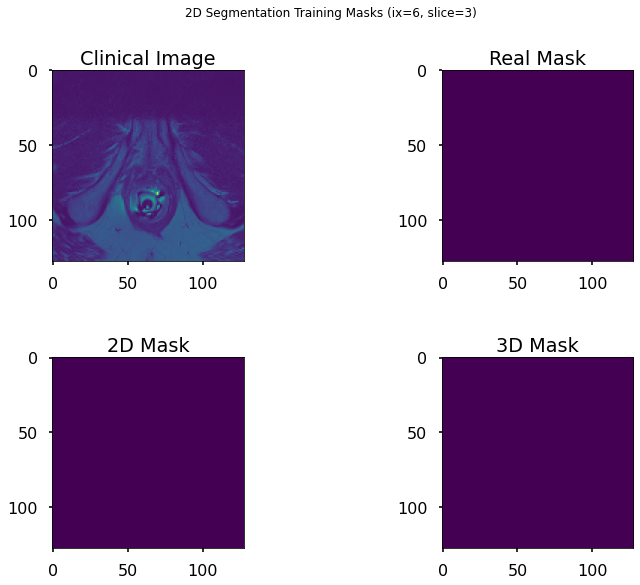

In [0]:
# A Good example 

sample_volume = 5
sample_slice = 2

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, gridspec_kw={'hspace': 0.5})
fig.suptitle(f'2D Segmentation Training Masks (ix={sample_volume+1}, slice={sample_slice+1})', fontsize=12)
ax1.imshow(np.squeeze(X_test[(sample_volume-1),(sample_slice-1),:,:,0]))
ax2.imshow(np.squeeze(Y_test[(sample_volume-1),(sample_slice-1),:,:,0]))
ax3.imshow(preds_test_t_2D[(sample_volume-1),(sample_slice-1),:,:,0])
ax4.imshow(preds_test_t_3D[(sample_volume-1),(sample_slice-1),:,:,0])
ax1.title.set_text('Clinical Image')
ax2.title.set_text('Real Mask')
ax3.title.set_text('2D Mask')
ax4.title.set_text('3D Mask')

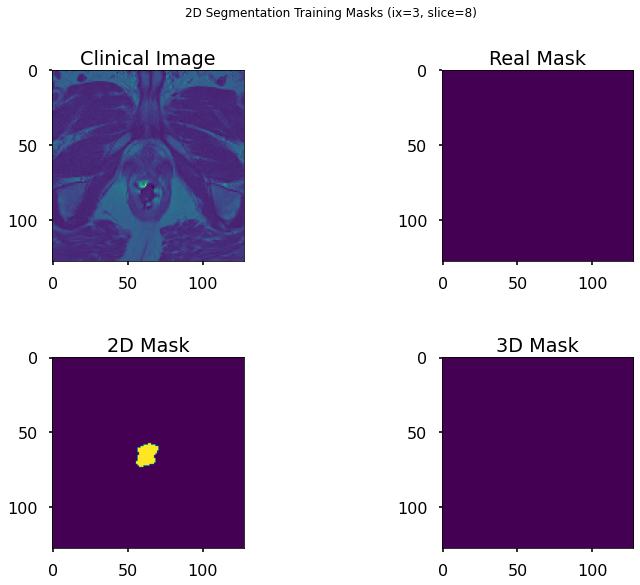

In [0]:
# A False potive example in 2D

sample_volume = 2
sample_slice = 7

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, gridspec_kw={'hspace': 0.5})
fig.suptitle(f'2D Segmentation Training Masks (ix={sample_volume+1}, slice={sample_slice+1})', fontsize=12)
ax1.imshow(np.squeeze(X_test[(sample_volume-1),(sample_slice-1),:,:,0]))
ax2.imshow(np.squeeze(Y_test[(sample_volume-1),(sample_slice-1),:,:,0]))
ax3.imshow(preds_test_t_2D[(sample_volume-1),(sample_slice-1),:,:,0])
ax4.imshow(preds_test_t_3D[(sample_volume-1),(sample_slice-1),:,:,0])
ax1.title.set_text('Clinical Image')
ax2.title.set_text('Real Mask')
ax3.title.set_text('2D Mask')
ax4.title.set_text('3D Mask')

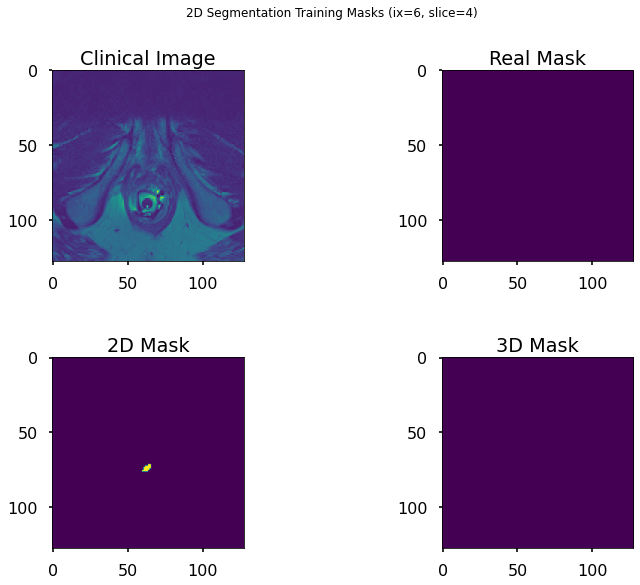

In [0]:
# A False potive example in 3D

sample_volume = 5
sample_slice = 3

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, gridspec_kw={'hspace': 0.5})
fig.suptitle(f'2D Segmentation Training Masks (ix={sample_volume+1}, slice={sample_slice+1})', fontsize=12)
ax1.imshow(np.squeeze(X_test[(sample_volume-1),(sample_slice-1),:,:,0]))
ax2.imshow(np.squeeze(Y_test[(sample_volume-1),(sample_slice-1),:,:,0]))
ax3.imshow(preds_test_t_2D[(sample_volume-1),(sample_slice-1),:,:,0])
ax4.imshow(preds_test_t_3D[(sample_volume-1),(sample_slice-1),:,:,0])
ax1.title.set_text('Clinical Image')
ax2.title.set_text('Real Mask')
ax3.title.set_text('2D Mask')
ax4.title.set_text('3D Mask')


(5, 32, 128, 128)


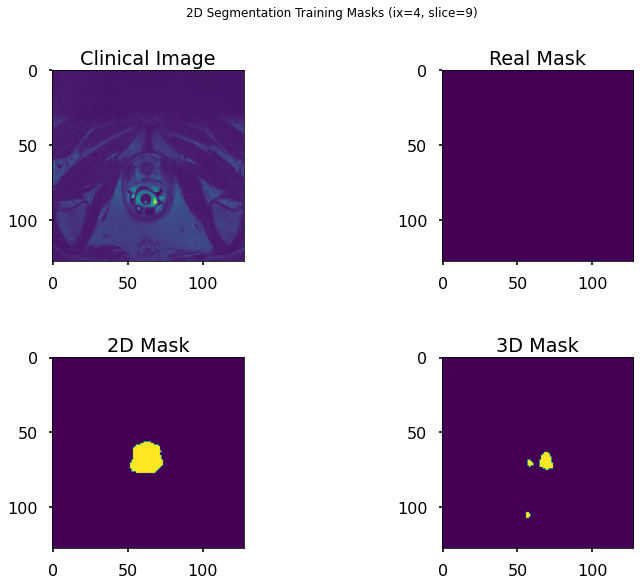

In [0]:
# Trial Slides

sample_volume = 4
sample_slice = 9

print(np.squeeze(Y_test).shape)

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, gridspec_kw={'hspace': 0.5})
fig.suptitle(f'2D Segmentation Training Masks (ix={sample_volume}, slice={sample_slice})', fontsize=12)
ax1.imshow(np.squeeze(X_test[(sample_volume-2),(sample_slice-2),:,:,0]))
ax2.imshow(np.squeeze(Y_test[(sample_volume-2),(sample_slice-2),:,:,0]))
ax3.imshow(preds_test_t_2D[(sample_volume-2),(sample_slice-2),:,:,0])
ax4.imshow(preds_test_t_3D[(sample_volume-2),(sample_slice-2),:,:,0])
ax1.title.set_text('Clinical Image')
ax2.title.set_text('Real Mask')
ax3.title.set_text('2D Mask')
ax4.title.set_text('3D Mask')
